# Import data

In [1]:
from DLtools import  prep_data

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from DLtools import  prep_data
import seaborn as sns


In [2]:
rain = 'data/instant_data/rain.csv'
water = 'data/instant_data/water.csv'
rw = prep_data.instant_df(rain_csv=rain,water_csv=water)

In [3]:
# Conduct Dataframe
df_water = rw.water_df
df_rain = rw.rain_df
df = rw.df

# Discard NaN value

In [4]:
# Percent of missing data
def report_missing_by_year(df):
    for yr in range(2010,2021):
        na_data = df.loc[str(yr)].count().sum()
        _total = df.loc[str(yr)].shape
        _total = _total[0]*_total[1]
        
        print("avaliable data in *{}* is ........{:.2f} || missing....{:.2f}%".format(yr,_total,(100-na_data*100/_total)))
        #data,total_datapoint = df.loc[str(yr)].count()
        

In [5]:
report_missing_by_year(df_rain)

avaliable data in *2010* is ........339085.00 || missing....62.49%
avaliable data in *2011* is ........339085.00 || missing....89.45%
avaliable data in *2012* is ........340014.00 || missing....46.53%
avaliable data in *2013* is ........339085.00 || missing....30.14%
avaliable data in *2014* is ........339085.00 || missing....26.96%
avaliable data in *2015* is ........339085.00 || missing....26.80%
avaliable data in *2016* is ........340014.00 || missing....23.19%
avaliable data in *2017* is ........339085.00 || missing....25.11%
avaliable data in *2018* is ........339085.00 || missing....20.85%
avaliable data in *2019* is ........339085.00 || missing....9.49%
avaliable data in *2020* is ........197877.00 || missing....8.60%


In [6]:
report_missing_by_year(df_water)

avaliable data in *2010* is ........16608960.00 || missing....100.00%
avaliable data in *2011* is ........16608960.00 || missing....99.98%
avaliable data in *2012* is ........16654464.00 || missing....76.11%
avaliable data in *2013* is ........16608960.00 || missing....43.70%
avaliable data in *2014* is ........16608960.00 || missing....37.51%
avaliable data in *2015* is ........16608960.00 || missing....33.74%
avaliable data in *2016* is ........16654464.00 || missing....28.55%
avaliable data in *2017* is ........16608960.00 || missing....26.64%
avaliable data in *2018* is ........16608960.00 || missing....26.10%
avaliable data in *2019* is ........16608960.00 || missing....17.97%
avaliable data in *2020* is ........9692352.00 || missing....19.50%


In [83]:
# select from 2013 due to missing data issue
start = '2013-01-01'
rw = prep_data.instant_df(rain_csv=rain,water_csv=water,start=start)

# Conduct Dataframe
df_water = rw.water_df
df_rain = rw.rain_df
df = rw.df



In [84]:
col_w,col_r = rw.only_related()
waterST = rw.rain_st_df
rainST = rw.water_st_df


df_water = df_water[col_w].resample('d').mean()
df_rain = df_rain[col_r]

def report_missing_by_station(df,col):
    nan_ratio = 0.1
    print(col,'\n')
    print("***From current station {} list below, find and discard station that too much missingdata \n".format(len(col)))
    print("missing data over {}%, as below".format(nan_ratio*100))
    for _col in df:   
        num_nan = df[_col].isnull().sum()
        num_total = df.shape[0]
        if num_nan/num_total > nan_ratio:
            try:
                col.remove(_col)
            except:
                pass
        else:
            print("REMAIN Station name {}, ,missing......{} (..{:.2f}%)".format(_col,num_nan,num_nan*100/num_total))
    print("total data points",num_total)
    print("remain .......{}...station".format(len(col)))
    print(col)
    return col

In [85]:
col_w = report_missing_by_station(df_water,col_w)

['BKK001_w', 'CPY010_w', 'PIN001_w', 'TB0002_w', 'CPY015_w', 'TBW014_w', 'KWN002_w', 'BKK007_w', 'NAN014_w', 'PIN002_w', 'NAN006_w', 'LBI002_w', 'BKK020_w', 'NAN011_w', 'KWN001_w', 'CPY001_w', 'NAN004_w', 'TB0004_w', 'DIV005_w', 'THA002_w', 'NAN010_w', 'CPY012_w', 'HDA004_w', 'CPY016_w', 'NAN002_w', 'TBW008_w', 'TB0001_w', 'CHM005_w', 'CHM004_w', 'BKK005_w', 'NAN012_w', 'CPY013_w', 'BKK004_w', 'BKK018_w', 'CHM002_w', 'PIN004_w', 'CPY003_w', 'CPY014_w', 'NAN008_w', 'CPY008_w', 'THA001_w', 'CPY002_w', 'PIN003_w', 'BKK013_w', 'CPY005_w', 'CPY007_w', 'BKK021_w', 'CPY017_w', 'CHM006_w', 'PIN006_w', 'BKK002_w', 'NAN007_w', 'VLGE12_w', 'NAN005_w', 'BKK003_w', 'NAN003_w', 'DIV003_w', 'CHM001_w', 'NAN001_w', 'TB0006_w', 'CPY006_w', 'CPY004_w', 'LBI001_w', 'GLF001_w', 'CPY011_w', 'NAN013_w', 'BKK019_w', 'BKK008_w', 'NAN009_w', 'PIN005_w', 'HDA005_w', 'CPY009_w'] 

***From current station 72 list below, find and discard station that too much missingdata 

missing data over 10.0%, as below
REMAIN 

In [86]:
col_r = report_missing_by_station(df_rain,col_r)

['PIN004_r', 'TBW008_r', 'TB0005_r', 'TB0006_r', 'VLGE04_r', 'TBR013_r', 'NAN003_r', 'PIN001_r', 'CPY016_r', 'BKK021_r', 'THA002_r', 'VLGE06_r', 'FOP001_r', 'PIN006_r', 'CPY009_r', 'TBW014_r', 'NAN005_r', 'CPY008_r', 'BKK018_r', 'LBI001_r', 'CHM001_r', 'GLF001_r', 'DIV005_r', 'CPY005_r', 'BKK020_r', 'TB0004_r', 'CPY011_r', 'NAN002_r', 'NAN004_r', 'CPY015_r', 'TB0007_r', 'NAN007_r', 'NAN006_r', 'CPY007_r', 'THA001_r', 'BKK005_r', 'HDA005_r', 'CPY003_r', 'BKK007_r', 'VLGE15_r', 'TB0002_r', 'CHM004_r', 'NAN009_r', 'VLGE19_r', 'LBI002_r', 'TBR012_r', 'BKK013_r', 'NAN010_r', 'NAN008_r', 'KWN001_r', 'CPY010_r', 'CHM005_r', 'CPY017_r', 'NAN014_r', 'CPY002_r', 'BKK001_r', 'CHM006_r', 'BKK004_r', 'BKK002_r', 'PIN002_r', 'CPY012_r', 'VLGE12_r', 'PIN005_r', 'BKK003_r', 'NAN001_r', 'VLGE25_r', 'VLGE11_r', 'CPY001_r', 'NAN011_r', 'PIN003_r', 'CPY014_r', 'NAN012_r', 'CPY013_r', 'BKK019_r', 'TB0001_r', 'CPY004_r', 'BKK008_r', 'CPY006_r', 'KWN002_r', 'DIV003_r', 'HDA004_r', 'NAN013_r', 'CHM002_r'] 

*

# Visualizae

In [17]:
df_water = df_water[col_w]
df_rain = df_rain[col_r]

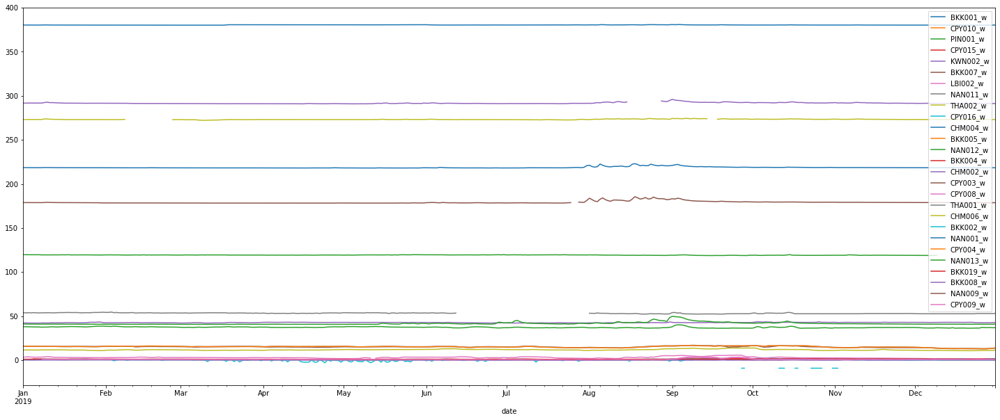

In [18]:
fig,ax = plt.subplots(figsize=(25,10))
df_water['2019'].plot(legend=True,ax=ax)
plt.legend(loc='upper right')
plt.show()

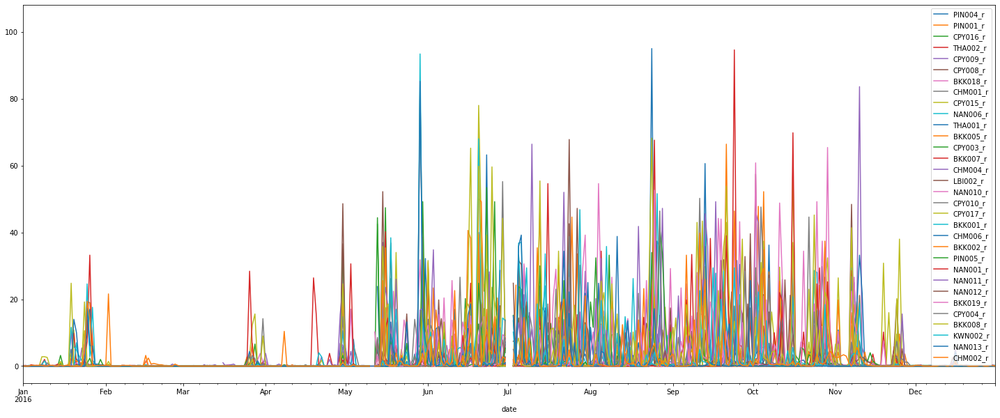

In [19]:
fig,ax = plt.subplots(figsize=(25,10))
df_rain['2016'].plot(legend=True,ax=ax)
plt.legend(loc='upper right')
plt.show()

<AxesSubplot:xlabel='date'>

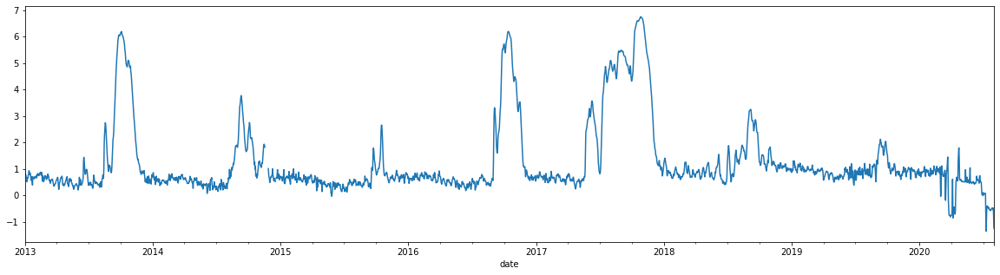

In [29]:
plt.figure(figsize=(20,5))
df_water['CPY010_w'].plot()

# PLOTPY

In [21]:
import plotly.graph_objects as go
import plotly as py

In [30]:
viz_water = go.Scatter(x=df_water['CPY010_w'].index,
                         y=df_water['CPY010_w'].values)

layout = go.Layout(title='Water level CPY010(target station CPY014nofound)', xaxis=dict(title='Date'),yaxis=dict(title='(mm)'))

In [31]:
fig = go.Figure(data=[viz_water], layout=layout)
fig.show()

In [32]:
fig = go.Figure()
for y in col_r:    
    fig.add_trace(go.Scatter(x=df_rain.index, y=df_rain[y],mode='lines',name=y))
fig.show()

In [33]:
fig = go.Figure()
for y in col_w:    
    fig.add_trace(go.Scatter(x=df_water.index, y=df_water[y],mode='lines',name=y))
fig.show()

In [26]:
#Findding outlier
def print_maxmin(df,col):
    for y in col:
        print("{}...Max:{:.2f},.....Min:{:.2f}".format(y,np.max(df[y]),np.min(df[y])))

In [27]:
print_maxmin(df_rain,col_r)

PIN004_r...Max:95.00,.....Min:0.00
PIN001_r...Max:85.40,.....Min:0.00
CPY016_r...Max:98.40,.....Min:0.00
THA002_r...Max:78.80,.....Min:0.00
CPY009_r...Max:129.20,.....Min:0.00
CPY008_r...Max:85.60,.....Min:0.00
BKK018_r...Max:80.20,.....Min:0.00
CHM001_r...Max:55.40,.....Min:0.00
CPY015_r...Max:78.00,.....Min:0.00
NAN006_r...Max:65.20,.....Min:0.00
THA001_r...Max:78.00,.....Min:0.00
BKK005_r...Max:97.20,.....Min:0.00
CPY003_r...Max:71.80,.....Min:0.00
BKK007_r...Max:94.60,.....Min:0.00
CHM004_r...Max:109.20,.....Min:0.00
LBI002_r...Max:75.40,.....Min:0.00
NAN010_r...Max:64.80,.....Min:0.00
CPY010_r...Max:73.00,.....Min:0.00
CPY017_r...Max:68.80,.....Min:0.00
BKK001_r...Max:88.20,.....Min:0.00
CHM006_r...Max:70.20,.....Min:0.00
BKK002_r...Max:87.40,.....Min:0.00
PIN005_r...Max:61.20,.....Min:0.00
NAN001_r...Max:97.00,.....Min:0.00
NAN011_r...Max:92.40,.....Min:0.00
NAN012_r...Max:103.00,.....Min:0.00
BKK019_r...Max:73.20,.....Min:0.00
CPY004_r...Max:66.00,.....Min:0.00
BKK008_r...Max:88

In [28]:
print_maxmin(df_water,col_w)

BKK001_w...Max:1.17,.....Min:-0.54
CPY010_w...Max:6.75,.....Min:-1.36
PIN001_w...Max:120.09,.....Min:118.40
CPY015_w...Max:1.35,.....Min:-0.54
KWN002_w...Max:47.27,.....Min:41.33
BKK007_w...Max:1.60,.....Min:-0.13
LBI002_w...Max:6.67,.....Min:0.46
NAN011_w...Max:55.11,.....Min:51.94
THA002_w...Max:14.38,.....Min:9.63
CPY016_w...Max:3.28,.....Min:-1.11
CHM004_w...Max:381.56,.....Min:379.78
BKK005_w...Max:0.81,.....Min:-0.12
NAN012_w...Max:41.69,.....Min:35.58
BKK004_w...Max:1.05,.....Min:-0.01
CHM002_w...Max:296.35,.....Min:290.75
CPY003_w...Max:16.98,.....Min:12.68
CPY008_w...Max:8.45,.....Min:-0.32
THA001_w...Max:17.77,.....Min:12.70
CHM006_w...Max:274.45,.....Min:268.28
BKK002_w...Max:1.09,.....Min:-9.10
NAN001_w...Max:225.14,.....Min:218.05
CPY004_w...Max:17.80,.....Min:12.65
NAN013_w...Max:49.75,.....Min:39.90
BKK019_w...Max:2.08,.....Min:0.29
BKK008_w...Max:0.46,.....Min:-0.39
NAN009_w...Max:187.86,.....Min:178.24
CPY009_w...Max:6.54,.....Min:-0.03


# Geo plot


In [76]:
waterST.head()

,code,name,lat,long,tambon,amphoe,province,basin,region,station_type
0,BMKN,ทต.สันติสุข,18.528992,98.821082,สันติสุข,ดอยหล่อ,เชียงใหม่,แม่น้ำปิง,ภาคเหนือ,R
1,NTAN,อบต.นาตาล,15.901693,105.278726,นาตาล,นาตาล,อุบลราชธานี,แม่น้ำโขง,ภาคตะวันออกเฉียงเหนือ,R
2,LMSK,ทต.ตาลเดี่ยว,16.771422,101.253664,ตาลเดี่ยว,หล่มสัก,เพชรบูรณ์,แม่น้ำป่าสัก,ภาคเหนือ,R
3,DKTI,อบต.แม่อิง,19.224938,99.993350,แม่อิง,ภูกามยาว,พะเยา,แม่น้ำโขง,ภาคเหนือ,R
4,BGBO,ทต.เกาะช้าง,12.103424,102.351994,เกาะช้าง,เกาะช้าง,ตราด,ชายฝั่งทะเลตะวันออก,ภาคกลาง,R


In [87]:
for i in waterST.index:
    waterST.at[i, "code"] = str(waterST.at[i, "code"]+"_w")
for i in rainST.index:
    rainST.at[i, "code"] = str(rainST.at[i, "code"]+"_r")

    

In [89]:
#waterST.rename(columns=lambda x: x+'_w', inplace=True)
waterST = waterST.loc[waterST['code'].isin(col_w)]
#rainST.rename(columns=lambda x: x+'-_r', inplace=True)
rainST = rainST.loc[rainST['code'].isin(col_r)]

In [91]:
waterST['text'] = waterST['tambon'] + '' + waterST['amphoe'] + ', ' + waterST['province'] + '' + waterST['basin'].astype(str)
rainST['text'] = rainST['tambon'] + '' + rainST['amphoe'] + ', ' + rainST['province'] + '' + rainST['basin'].astype(str)

In [92]:
fig = go.Figure(data=go.Scattergeo(
        lon = waterST['long'],
        lat = waterST['lat'],
        text = waterST['text'],
        mode = 'markers',
        #marker_color = waterST['basin'],
        ))
fig.update_layout(
        title = 'Water Stations in TH',
        geo_scope='asia',)
fig.show()

In [93]:
fig = go.Figure(data=go.Scattergeo(
        lon = rainST['long'],
        lat = rainST['lat'],
        text = rainST['text'],
        mode = 'markers',
        #marker_color = waterST['basin'],
        ))
fig.update_layout(
        title = 'Rain Stations in TH',
        geo_scope='asia',)
fig.show()